# End-to-End Multi-class Dog Breed Classification

This Notebook builds on an end-to-end multi-class image classifier using TensorFLow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog , given the image of a dog

## 2. Data

The Data we are using is from Kaggle's Dog Breed Identification Comeptition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

For each image in the test set, you must predict a probability for each of the different breeds. The file should contain a header and have the following format:

`id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
etc.`

The Evaluation is a file with prediction probabilities of each dog bread of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some information about the Data:
* We are dealing with images (unstructed data) so it's probably better if we use Deep Learning/Transfer Learning
* There are 120 Dog breeds (this means there are 120 different classes)
* There are around 10000+ images in the training set (These images have labels)
* There are around 10000+ images in the test set (These images have no labels because we'll want to predict them)

In [1]:
# Uploading the data from Google Drive
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog_vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Dog_vision"

## Get our Workspace Ready
* Import TensorFlow 2
* Import TrensorFlow Hub
* Make sure we are using a GPU

In [2]:
# Import Necessary Tools
import tensorflow as  tf
import tensorflow_hub as hub
print("TF Version",tf.__version__)
print("TF Hub Version", hub.__version__)

#  Check for GPU Availability
print("GPU","Available" if tf.config.list_physical_devices else "Not Available")

TF Version 2.17.0
TF Hub Version 0.16.1
GPU Available


## Getting our data ready (turning into Tensors)

With all the Machine Learning Models, our data has to be in numerical formal. So we will be Turning our images into Tensors

Lets start by accessing our data and checking out the labels.

In [3]:
# Check out labels
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog_vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()



                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


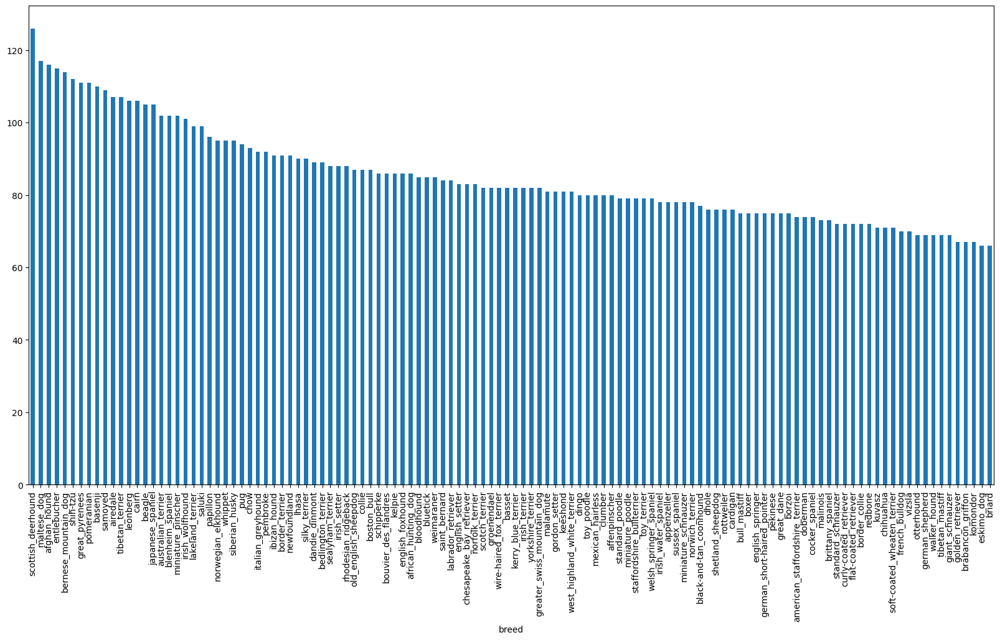

In [4]:
# How many images are there per breed (per class)
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [5]:
labels_csv["breed"].value_counts().median()

82.0

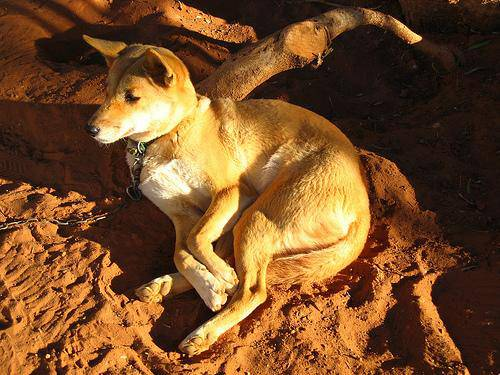

In [6]:
# Lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels

Lets get a list of all of our image file pathnames

In [7]:
# Create pathnames from image ID's
filename=["drive/MyDrive/Colab Notebooks/Dog_vision/train/" + fname +".jpg" for fname in labels_csv["id"]]

# Check for first 10
filename[:10]

['drive/MyDrive/Colab Notebooks/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog_vision/train/"))==len(filename):
  print("Filenames match actual amount of files" )
else:
  print("Dont match")

Filenames match actual amount of files


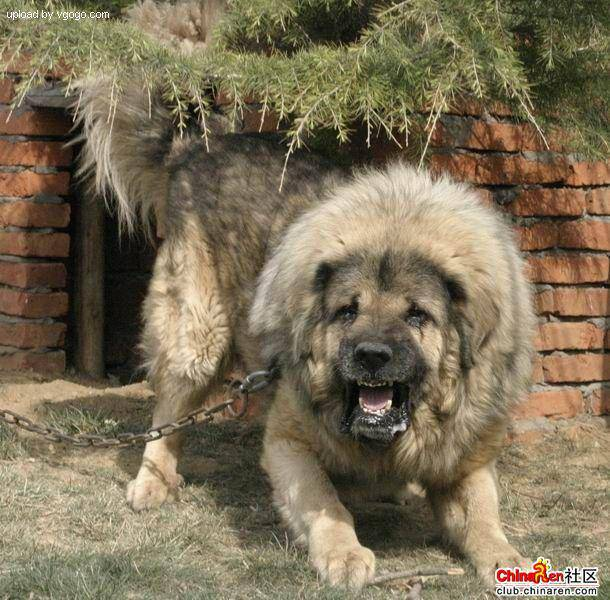

In [9]:
# One more check
Image(filename[9000])

In [10]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels

In [11]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)

In [12]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
# See if numbers of labels matches filenames
if len(labels==len(filename)):
  print("Same length")
else:
  print("Does not match")

Same length


In [15]:
# Find unique label values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn label Into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: Turning boolean array into integers
print(labels[0]) # Original Label
print(np.where(unique_breeds==labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[2].astype(int)) # There will be a 1 where the sample label occurs

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filename[:10]

['drive/MyDrive/Colab Notebooks/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since Kaggle doesn't come with a Validation set, we are going to create our own

In [23]:
# Setup x and y labels
x=filename
y=boolean_labels

We are going to start off experimenting with ~1000 images and increase as need

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [25]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val= train_test_split(x[:NUM_IMAGES],
                                              y[:NUM_IMAGES],
                                              test_size=0.2,
                                              random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [26]:
# lets have a geez on the training data
x_train[:5],y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/Dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/Dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/Dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,

## Preprocessing Images (Turning Images into Tensors)

To Preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Nomralize our Image (Convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

Check this for more info: https://www.tensorflow.org/tutorials/load_data/images


Before we do, let's see what importing an image looks like.

In [27]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [28]:
image.max(), image.min()

(255, 0)

In [29]:
# Convert image to Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we have seen what an image looks like as a Tensor, Lets make a function to preprocess them

In [30]:
# Define image size
IMG_SIZE=224

# Create afunctiojn for preprocessing images
def process_image(image_path,image_size=IMG_SIZE):
  """
  Takes and image file path and turns it into aa Tensor
  """
  # Read in an image file
  image=tf.io.read_file(image_path)

  # Turn the jpg  image into numerical Tensors with 3 colour channels (Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)

  # Convert the colour channel values from 0-225 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turn our data into batches

Why turn our data into batches?


Lets say we're trying to process 10000+ images in one go...they all might not fit into memory

So thats why we do 32 (This is the batch size) images per time (You can manually adjust the batch size if need be)

In order to use TensorFlow effectively, we need our data to be in the form of Tensor Tuples which look like this:
`(image,label)`

More info:https://x.com/ylecun/status/989610208497360896?s=20

In [31]:
# Create a simple function to return tuple(image,label) of tensors
"""
Takes an Image file path name and associated label,processes the image and returns a tuple of (image,label)
"""
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [32]:
# Demo of the ablove
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form `(image,label)`, Lets make a functiont to turn all of our data (`x`,`y`) into batches  

In [33]:
# Define the batch size,32 is a good start
BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (x) and labels (y) pairs.
  Shuffles the data if its training data but does not shuffle if its validation data
  Also accepts test data as input(no labels)
  """
  # If the data is the test data set, we probably dont have labels
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only filepath (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid data set, we dont need to shuffle it
  elif valid_data:
    print("Creating valid Data Batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) # filepath and  labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating Training Data Batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) # filepath and labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(x))


    # Create (image,label) tuples (this also turns the image path into preprocessed image)
    data=data.map(get_image_label)

    # and turn the data into Batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [34]:
# Creating training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating Training Data Batches
Creating valid Data Batches


In [35]:
# Check out different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches however these can a little hard to comprehend, lets visualize them

In [36]:
import matplotlib.pyplot as plt

# Craete a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for  diaplaying 25 images)
  for i in range(25):
    # Create Subplots(5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid line off
    plt.axis("off")

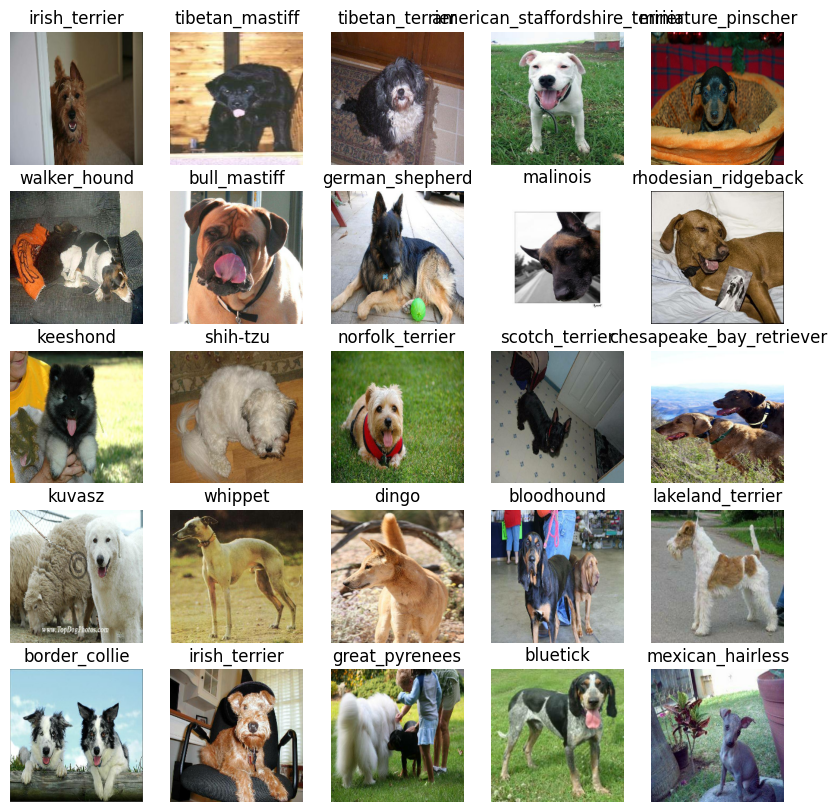

In [37]:
# Now lets visualize the data in a training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

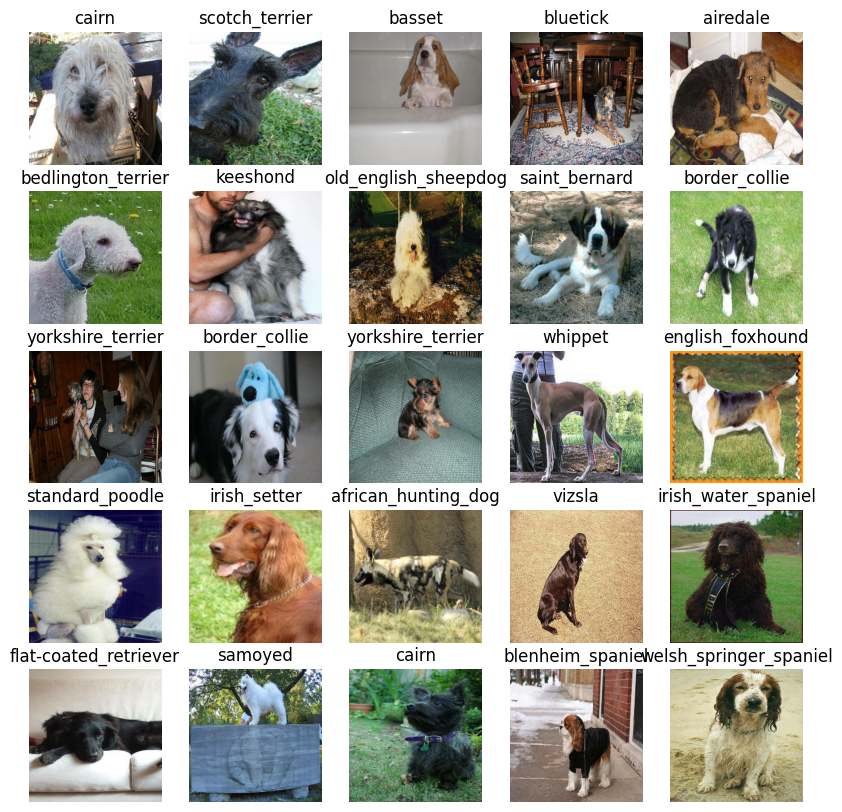

In [38]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from KaggleHub-https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true

In [39]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # Batch,height,widht,colour
# Setup Output shape of our model
OUTPUT_SHAPE=len(unique_breeds)
# Setup Model URL from TensorFlow Hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true"

In [40]:
import tensorflow_hub as hub
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Lambda

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with: ',MODEL_URL)

  hubs_layer = hub.KerasLayer(MODEL_URL)
  model = tf.keras.Sequential([
       tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = 'softmax') # Layer 2 (output layer)
  ])
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )
  model.build(INPUT_SHAPE)
  return model

In [41]:
model=create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callbacks

Callbacks are helper functions to do such things as save its progress, checks its progress or stop training early if a model stops improving...

We'll create two callbacks, one for TensorBoard which helps track our model progress and another for earlt stopping that prevents our model for training too long


### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit function
3. Visualize our models training logs with the `%tensorboard` magic function (we'll get to this after model training)

In [42]:
# Load TensorBoard notebook extention
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log Directory for storing TensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog_vision/logs",
                      # Make it so the logs gets trained whenever we run as experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model fro overfitting by stopping traininf if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [44]:
# Create an Early Stopping Callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

 ## Training a model (on subset of data)

 Our first model is only going to train on a 1000 images to make sure everything is working.


In [45]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}

In [46]:
# Check to make sure we are still running on a GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else ("not available"))

GPU available


Lets create a function which trains the model

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data,validation data, number of epochs to train data (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [47]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and return a trained version.
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model

In [48]:
# Fit the model to the data
model=train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 306s 12s/step - accuracy: 0.0518 - loss: 5.0436 - val_accuracy: 0.3200 - val_loss: 3.2941
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 209ms/step - accuracy: 0.6356 - loss: 1.9009 - val_accuracy: 0.5200 - val_loss: 2.1590
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - accuracy: 0.9603 - loss: 0.5723 - val_accuracy: 0.6050 - val_loss: 1.6777
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.9873 - loss: 0.2649 - val_accuracy: 0.6500 - val_loss: 1.5050
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - accuracy: 0.9934 - loss: 0.1443 - val_accuracy: 0.6600 - val_loss: 1.4242
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 169ms/step - accuracy: 0.9996 - loss: 0.0973 - val_accuracy: 0.6450 - val_loss: 1.3875
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 221ms/step - accuracy: 1.0000 - loss: 0.0771 - val_accu

**Question:** It looks like our model is overfitting because its performing better on training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [49]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog_vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [50]:
# Make predictions on the validation_data (Not used to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 630ms/step


array([[3.3162248e-03, 7.7541627e-05, 5.7841293e-03, ..., 3.8936117e-03,
        4.3639448e-04, 7.7068876e-03],
       [7.0347157e-03, 1.7770769e-03, 3.8557824e-02, ..., 7.7325065e-04,
        2.3202100e-03, 9.4479357e-04],
       [1.9362662e-05, 2.2496175e-05, 4.9110164e-05, ..., 1.2395538e-04,
        2.6160407e-05, 1.0800424e-05],
       ...,
       [4.0801533e-05, 3.5539095e-05, 1.8002841e-04, ..., 6.5432825e-05,
        1.4662220e-04, 1.5608304e-05],
       [1.8315730e-03, 3.2595158e-04, 2.5288571e-04, ..., 1.5932015e-04,
        2.9358831e-05, 1.3732292e-02],
       [1.1190923e-04, 6.7053683e-05, 7.5275928e-04, ..., 1.9352268e-03,
        1.3053397e-03, 6.4815547e-05]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
# First prediction
index=42
print(predictions[0])
print(f"Max Value (Probability of Prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted labels {unique_breeds[np.argmax(predictions[index])]}")

[3.31622479e-03 7.75416265e-05 5.78412926e-03 3.66420136e-04
 1.11233059e-03 6.79626537e-05 1.05573058e-01 5.71564480e-04
 2.98398721e-04 6.07061083e-04 1.46401185e-03 8.24198069e-04
 9.47839522e-04 5.24181269e-05 1.33707980e-03 2.52349908e-03
 9.34934535e-04 5.87069914e-02 1.36291041e-04 2.23908151e-04
 1.14571070e-03 1.27052670e-04 1.12411544e-04 1.24155241e-03
 1.24908853e-04 1.99691553e-04 1.99199989e-01 9.14368429e-04
 1.29132264e-03 6.90691348e-04 1.89628190e-04 5.45998802e-03
 4.42609191e-04 4.68624894e-05 5.59617147e-05 5.00899665e-02
 3.56627512e-04 9.22500098e-04 3.92050715e-05 5.82646928e-04
 3.62189184e-03 1.87053629e-05 8.87370770e-05 3.75479780e-04
 2.47874821e-04 9.09616123e-04 3.80677011e-05 1.52856286e-03
 2.69406679e-04 2.14321335e-04 1.39171199e-03 8.51524164e-05
 1.43097452e-04 3.83236504e-04 1.42858291e-04 1.61892138e-04
 7.32365472e-04 6.40371954e-03 3.41814640e-03 1.00100882e-01
 7.66688318e-04 5.87515300e-04 1.22577639e-03 1.25560300e-05
 3.52281961e-04 1.397373

Having the above functionality is great but we want to able to do it at scale

And it would be even better if we could see the image the prediction is being made on

**Note:** Prediction probabilities is also known as confidence labels


In [53]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction_probabilities
pred_label=get_pred_label(predictions[15])
pred_label

'miniature_poodle'

Now since our validation data is still in a batch dataset we will have to unbatch it to make predictions on the Validation images and then compare those predictions to the validation labels (truth labels)

In [54]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
# Create a function to unbatch validation batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels.
  """
  images_=[]
  labels_=[]

  # Loop through Unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_

# Unbatchify the Validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation Labels(truth labels)
* Validation Images

Lets make some function to make these all a bit more visual

We will make a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and labels and an integers.

* Convert the prediction probabilities to a predicted label

* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot

In [56]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the predictions, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format (pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

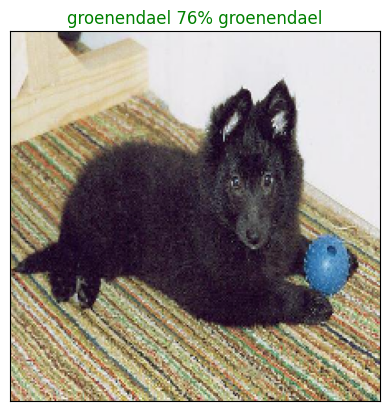

In [57]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=77)

Now we've got one function to visualize our models predictions, lets make another to view our models top 10 predictions

This function will:
* Take an imput of prediction probabilities array and a ground truth array and an integer
* Find a predicted label using `get_pred_label`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values colouring the true label green


In [58]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plot the Top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Find top 10 predicton labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


  # Change the colour of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

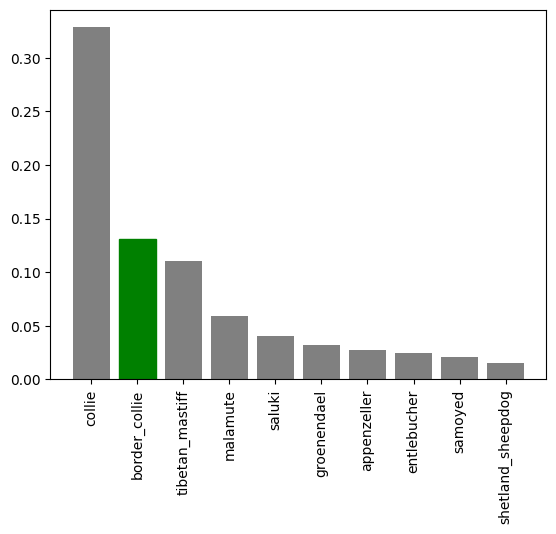

In [59]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, lets check out a few


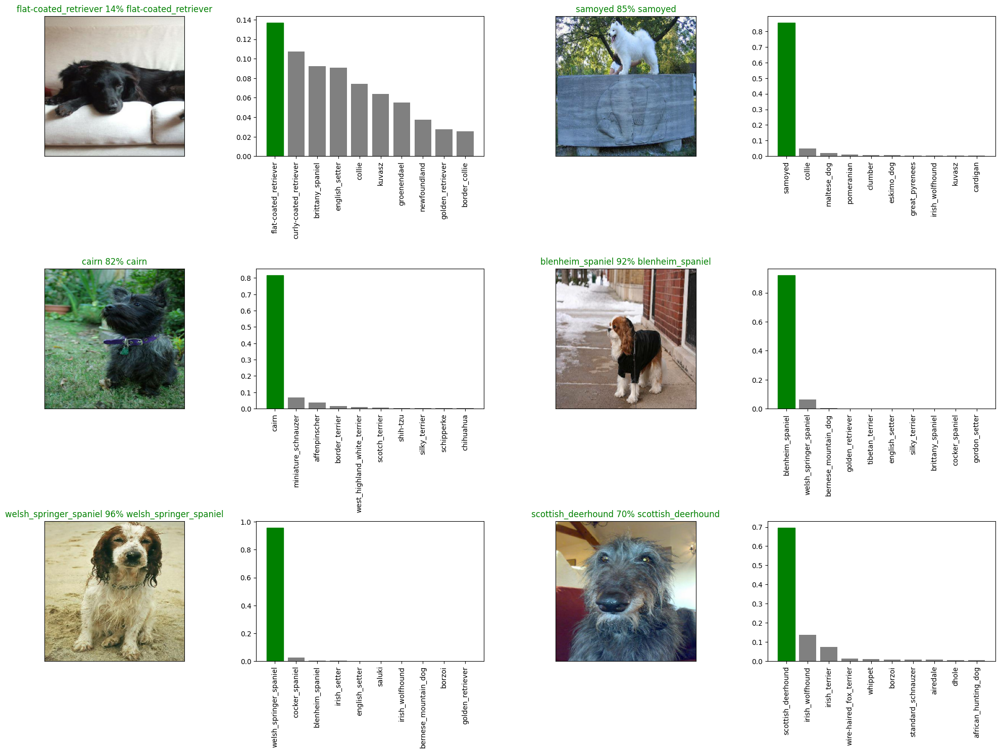

In [60]:
# Let's check out a few predictions and their different values
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?